# Data merging and Price predicting

## Import packages

In [1]:
import pandas as pd
import os
import sys
import logging
import joblib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns


In [2]:
# Add ../src to Python path
project_root = os.path.abspath(os.path.join(os.path.dirname('__file__'), '../src'))
sys.path.insert(0, project_root)

# Import the parse config function to parse the .toml file
from utils.config_tool import parse_config
from utils.logging_tool import initialize_logger


In [3]:
config_file = "../config/predict_stock_w_news.toml"
config = parse_config(config_file)

## Load the news topic data

In [4]:
news_path = os.path.join(config['info']['local_data_path'], 'model_news', config['news_model']['output']['news_topic_file'])
news_topics = pd.read_csv(news_path)

In [5]:
news_topics.head()

,date,key_topic,key_topic_wights,all_topics
0,2016-01-01,0,0.710101,"[(0, 0.7101014560584669), (29, 0.1157700639023..."
1,2016-01-01,6,0.974869,"[(6, 0.9748689571927619), (34, 0.0235119842678..."
2,2016-01-01,175,0.327583,"[(175, 0.32758339144607274), (32, 0.2756524214..."
3,2016-01-01,41,0.664535,"[(41, 0.6645350782557587), (30, 0.166399590789..."
4,2016-01-01,31,0.560965,"[(31, 0.5609646467999564), (6, 0.2759288537979..."


In [6]:
# Round the topic time to the date. We need to handle ISO 8601 date format
news_topics['date'] = pd.to_datetime(news_topics['date'], format = 'mixed').apply(lambda x: x.date().isoformat())

In [7]:
news_topics.head()

,date,key_topic,key_topic_wights,all_topics
0,2016-01-01,0,0.710101,"[(0, 0.7101014560584669), (29, 0.1157700639023..."
1,2016-01-01,6,0.974869,"[(6, 0.9748689571927619), (34, 0.0235119842678..."
2,2016-01-01,175,0.327583,"[(175, 0.32758339144607274), (32, 0.2756524214..."
3,2016-01-01,41,0.664535,"[(41, 0.6645350782557587), (30, 0.166399590789..."
4,2016-01-01,31,0.560965,"[(31, 0.5609646467999564), (6, 0.2759288537979..."


## Load the stock data

In [8]:
stock_path = os.path.join(config['info']['local_data_path'], 'data_clean', config['fin_model']['output']['abnormal_return_file'])

abreturn = pd.read_csv(stock_path)

In [9]:
abreturn.head()

,date,ticker,return,MKT,SMB,HML,RMW,CMA,RF,return_hat,residual
0,2016-01-05,AAPL,-0.025059,0.0012,-0.0024,0.0001,0.0005,0.0031,0.0,-0.000514,-0.024545
1,2016-01-06,AAPL,-0.019570,-0.0135,-0.0023,0.0000,0.0015,0.0003,0.0,-0.013793,-0.005776
2,2016-01-07,AAPL,-0.042205,-0.0244,-0.0029,0.0008,0.0049,0.0036,0.0,-0.027886,-0.014318
3,2016-01-08,AAPL,0.005288,-0.0111,-0.0052,-0.0003,0.0025,0.0005,0.0,-0.010588,0.015876
4,2016-01-11,AAPL,0.016192,-0.0006,-0.0061,0.0040,0.0065,0.0034,0.0,-0.002521,0.018714


In [10]:
# Make sure the date of the same type
abreturn['date'] = pd.to_datetime(abreturn['date'])


In [11]:
# Get the tickers
tickers = abreturn['ticker'].unique()
print(f"The tickers are {tickers}, the length is {len(tickers)}")

The tickers are ['AAPL' 'AMZN' 'BAC' 'BRK-B' 'CVX' 'DIS' 'GE' 'GOOGL' 'HD' 'INTC' 'JNJ'
 'JPM' 'KO' 'MA' 'META' 'MSFT' 'PFE' 'PG' 'UNH' 'V' 'VZ' 'WFC' 'WMT' 'XOM'], the length is 24


## Choose a ticker

In [12]:
# Lets look at the chosen ticker
ticker = tickers[23]
ab_ticker = abreturn[abreturn['ticker'] == ticker]
ab_ticker['residual'].describe()

count    1004.000000
mean       -0.000038
std         0.008310
min        -0.035738
25%        -0.004786
50%        -0.000163
75%         0.004633
max         0.046559
Name: residual, dtype: float64

## Data Visulization

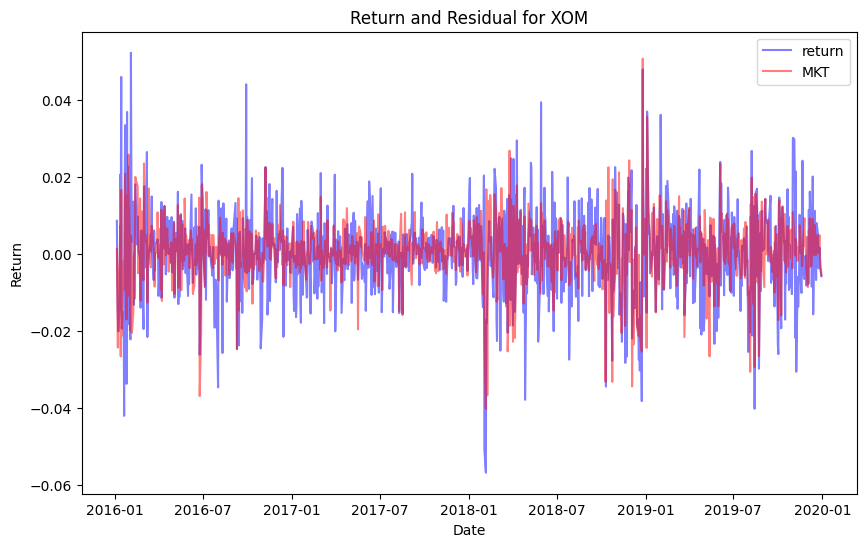

In [13]:
plt.figure(figsize=(10, 6))

plt.plot(ab_ticker['date'], ab_ticker['return'], label='return', color='blue', alpha = 0.5)

plt.plot(ab_ticker['date'], ab_ticker['MKT'], label='MKT', color='red', alpha = 0.5)

plt.title(f"Return and Residual for {ticker}")
plt.xlabel("Date")
plt.ylabel("Return")
plt.legend()

plt.show()

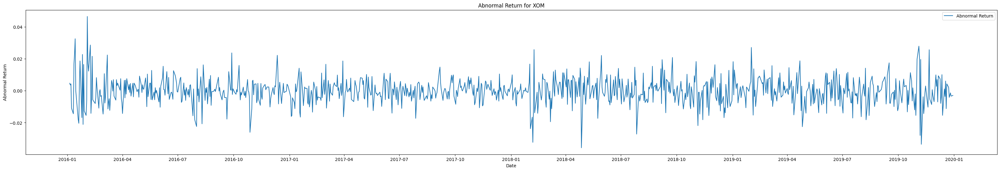

In [14]:
plt.figure(figsize=(40, 6))

plt.plot(ab_ticker['date'], ab_ticker['residual'], label='Abnormal Return')
plt.xlabel('Date')
plt.ylabel('Abnormal Return')

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))  # Set major ticks at the start of each quarter
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Use '%Y-Q%q' for quarters

plt.title(f'Abnormal Return for {ticker}')
plt.legend()

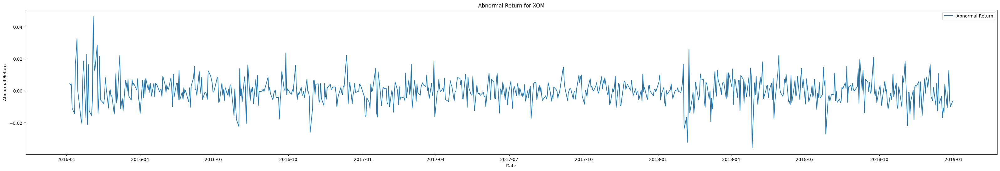

In [15]:
plt.figure(figsize=(40, 6))

plt.plot(ab_ticker[ab_ticker['date'] <= '2018-12-31']['date'], ab_ticker[ab_ticker['date'] <= '2018-12-31']['residual'], label='Abnormal Return')
plt.xlabel('Date')
plt.ylabel('Abnormal Return')

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))  # Set major ticks at the start of each quarter
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Use '%Y-Q%q' for quarters

plt.title(f'Abnormal Return for {ticker}')
plt.legend()

Now we examine the time series stationarity:

In [16]:
from statsmodels.tsa.stattools import adfuller

In [17]:
result = adfuller(ab_ticker[ab_ticker['date'] <= '2018-12-31']['residual'])
print(f"ADF Statistic: {result[0]}, p-value: {result[1]}")

ADF Statistic: -14.748350754805065, p-value: 2.5075588504152827e-27


In [18]:
# Look at all the tickers
stationarity_stock = np.zeros((len(tickers), 2))

for i, index in enumerate(tickers):
    abticker = abreturn[abreturn['ticker'] == index]
    result = adfuller(abticker[abticker['date'] <= '2018-12-31']['residual'])
    stationarity_stock[i, :] = [result[0], result[1]]
 

In [19]:
max_adf = np.argmax(stationarity_stock[:,0])
min_p = np.argmin(stationarity_stock[:,1])

print(f"The ticker with the largest ADF statistic is {tickers[max_adf]} with ADF statistic {stationarity_stock[max_adf, 0]}, the p-value is {stationarity_stock[max_adf, 1]}")
print(f"The ticker with the lowest p-value is {tickers[min_p]} with p-value {stationarity_stock[min_p, 1]}")

The ticker with the largest ADF statistic is BRK-B with ADF statistic -7.32760550779775, the p-value is 1.150042397675396e-10
The ticker with the lowest p-value is AAPL with p-value 0.0


Interpretation

For Amazon:

ADF Statistic: -7.32760550779775

- This value is quite negative, indicating strong evidence against the null hypothesis.

p-value: 1.150042397675396e-10

- This very low p-value suggests that the series is stationary.

Conclusion
The results of the ADF test indicate that the time series `ab_ticker['residual']` is stationary, meaning its statistical properties do not change over time. This is important for time series analysis and modeling, as many models assume stationarity.

We examine the autocorrelation:

In [20]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

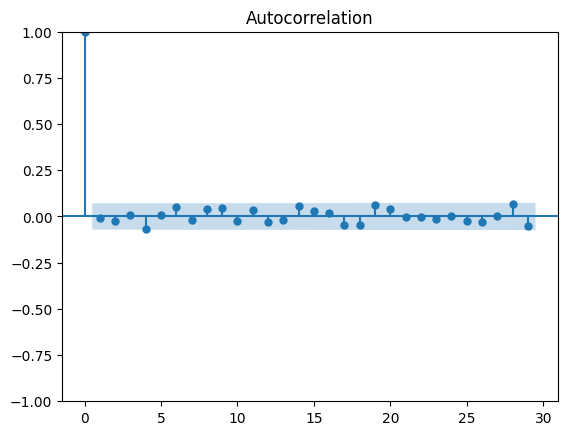

In [21]:
plot_acf(ab_ticker[ab_ticker['date'] <= '2018-12-31']['residual'])
plt.show()

There is no significant lags. So the autocorrelation is small.

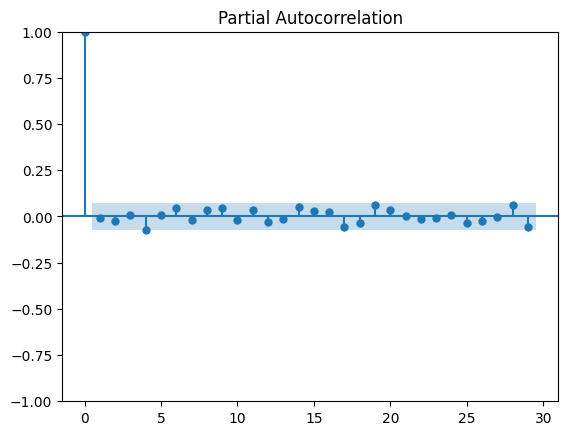

In [22]:
plot_pacf(ab_ticker[ab_ticker['date'] <= '2018-12-31']['residual'])
plt.show()

There is also no significant spike. So the partial autocorrelation is small.

This indicates the residual data is very likely to be the white noise, where no autoregression is needed. The prediction must rely on the exogenous features.

## Prepare the feature data

In [23]:
dates_news = news_topics['date'].unique()
topics = news_topics['key_topic'].unique()
print(f"The dates are {dates_news}, the length is {len(dates_news)}")
print(f"The length of the topics is {len(topics)}")

The dates are ['2016-01-01' '2016-01-02' '2016-01-03' ... '2019-12-29' '2019-12-30'
 '2019-12-31'], the length is 1461
The length of the topics is 163


In [24]:
# Ensure that dates_news is defined
news_topics[news_topics['date'] == dates_news[0]]['key_topic'].value_counts()

key_topic
41     31
5      31
71     16
43     15
15     14
       ..
126     1
280     1
147     1
68      1
52      1
Name: count, Length: 75, dtype: int64

In [25]:
news_topics['key_topic'].value_counts().describe()

count      163.000000
mean     10913.423313
std      14819.077764
min          1.000000
25%          2.000000
50%       1683.000000
75%      19595.000000
max      82949.000000
Name: count, dtype: float64

In [26]:
# Filter the news topics that are not too small
threshold = 10
big_topics = [topic for topic in topics if news_topics[news_topics['key_topic'] == topic]['key_topic'].count() > threshold]
print(big_topics)
print(type(big_topics))

[0, 6, 41, 31, 49, 44, 5, 37, 1, 28, 4, 30, 40, 23, 3, 69, 15, 2, 71, 32, 14, 12, 9, 8, 21, 13, 20, 16, 22, 36, 39, 18, 78, 54, 53, 48, 34, 35, 46, 43, 68, 24, 11, 33, 29, 42, 17, 108, 25, 56, 7, 111, 60, 51, 38, 72, 62, 77, 26, 81, 27, 19, 52, 58, 89, 85, 76, 45, 67, 47, 80, 73, 97, 50, 10, 106, 103, 70, 83, 55, 117, 109, 107, 88, 64, 110, 75, 114, 59, 96, 95, 105, 93, 57, 91, 102, 84, 63, 61, 100, 98, 66, 65, 101, 79, 104, 90, 113, 173, 94, 99, 87]
<class 'list'>


In [27]:
# Filtered news topics data
news_topics_filtered = news_topics[news_topics['key_topic'].isin(big_topics)]

In [28]:
news_topics_filtered['key_topic'].value_counts().describe()

count      112.000000
mean     15882.062500
std      15520.665731
min         20.000000
25%       1160.500000
50%      13404.000000
75%      24699.500000
max      82949.000000
Name: count, dtype: float64

This one is very slow, The current code runs slowly because it uses nested loops and .iloc to access and modify DataFrame elements, which is inefficient. We can optimize it by using vectorized operations and groupby.

### Merged data

In [29]:
# Define the merged data DataFrame
merged = pd.DataFrame()
merged['date'] = ab_ticker['date']
merged['return'] = ab_ticker['return']
merged['return_hat_reduced'] = ab_ticker['return_hat']

# Group by date and key_topic, then count occurrences
topic_counts = news_topics_filtered.groupby(['date', 'key_topic']).size().unstack(fill_value=0)

# Ensure the 'date' column in topic_counts is of the same type as in merged
topic_counts.index = pd.to_datetime(topic_counts.index)

# Merge the topic counts with the merged DataFrame
merged = merged.merge(topic_counts, on='date', how='left').fillna(0)

In [30]:
merged.head()

,date,return,return_hat_reduced,0,1,2,3,4,5,6,...,106,107,108,109,110,111,113,114,117,173
0,2016-01-05,0.008521,0.003810,46,84,22,19,218,22,16,...,3,7,4,2,1,0,0,1,0,0
1,2016-01-06,-0.008321,-0.011936,44,93,16,81,145,35,23,...,3,0,5,5,0,3,0,1,0,0
2,2016-01-07,-0.016006,-0.020314,63,131,21,35,76,41,30,...,9,0,4,2,1,2,0,1,0,0
3,2016-01-08,-0.020202,-0.009257,39,105,16,40,68,32,8,...,6,0,4,3,1,1,0,1,0,0
4,2016-01-11,-0.013389,0.001031,63,100,24,20,36,23,16,...,2,1,4,0,0,3,0,0,0,0


In [31]:
merged.columns

Index([              'date',             'return', 'return_hat_reduced',
                          0,                    1,                    2,
                          3,                    4,                    5,
                          6,
       ...
                        106,                  107,                  108,
                        109,                  110,                  111,
                        113,                  114,                  117,
                        173],
      dtype='object', length=115)

## Data EDA

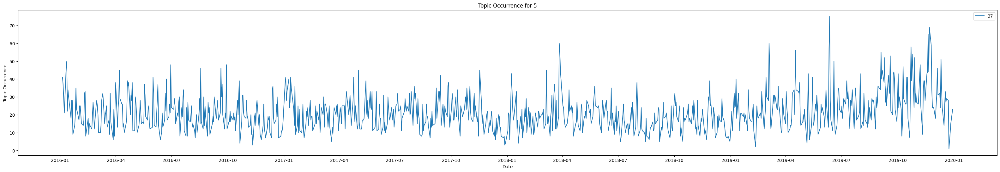

In [32]:
# Plot the occurrence of the topics
index = 7

plt.figure(figsize=(40, 6))

plt.plot(merged['date'], merged[big_topics[index]], label=big_topics[index])

plt.xlabel('Date')
plt.ylabel('Topic Occurrence')

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))  # Set major ticks at the start of each quarter
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Use '%Y-Q%q' for quarters

plt.title(f'Topic Occurrence for {topics[index]}')
plt.legend()

plt.show()

In [33]:
# look at the stationarity of the topic occurrence
result = adfuller(merged[big_topics[index]])
print(f"ADF Statistic: {result[0]}, p-value: {result[1]}")
print(result[4])

ADF Statistic: -4.200618666985445, p-value: 0.0006573131519665038
{'1%': -3.4370334797663844, '5%': -2.8644907213150725, '10%': -2.568341114581742}


In [34]:
# Look at all the topics
stationarity_topic = np.zeros((len(big_topics), 2))

for i, topic in enumerate(big_topics):
    result = adfuller(merged[topic])
    stationarity_topic[i, :] = [result[0], result[1]]

print(stationarity_topic)


[[-4.22361351e+00  6.00811683e-04]
 [-6.29521139e+00  3.51954961e-08]
 [-9.27029604e+00  1.33243382e-15]
 [-2.01391226e+00  2.80506570e-01]
 [-1.30032376e+00  6.29024180e-01]
 [-1.11097608e+00  7.10674981e-01]
 [-3.33204687e+00  1.35053555e-02]
 [-4.20061867e+00  6.57313152e-04]
 [-7.04668709e-01  8.45536528e-01]
 [-1.31132902e+00  6.23973467e-01]
 [-4.29803333e+00  4.47708715e-04]
 [-4.11035526e+00  9.31049009e-04]
 [-6.00354856e+00  1.63570228e-07]
 [-9.43027795e+00  5.21250130e-16]
 [-3.75862296e+00  3.36018840e-03]
 [-2.23923023e+00  1.92316374e-01]
 [-6.31672088e+00  3.13739765e-08]
 [-2.90665047e+00  4.45800862e-02]
 [-8.00039766e+00  2.34239458e-12]
 [-2.97142136e+00  3.76508561e-02]
 [-2.07474909e+00  2.54788571e-01]
 [-2.60899482e+00  9.11524345e-02]
 [-2.55570959e+00  1.02500988e-01]
 [-3.92505561e+00  1.85799719e-03]
 [-4.08733335e+00  1.01628462e-03]
 [-4.17581914e+00  7.23829618e-04]
 [-4.09048211e+00  1.00421049e-03]
 [-4.57715718e+00  1.42288561e-04]
 [-6.60811266e+00  6

In [35]:
# Find the topic with the largest ADF statistic
max_adf = np.argmax(stationarity_topic[:,0])
min_p = np.argmin(stationarity_topic[:,1])

print(f"The topic with the largest ADF statistic is {big_topics[max_adf]} with ADF statistic {stationarity_topic[max_adf, 0]}, the p-value is {stationarity_topic[max_adf, 1]}")
print(f"The topic with the lowest p-value is {big_topics[min_p]} with p-value {stationarity_topic[min_p, 1]}")

The topic with the largest ADF statistic is 1 with ADF statistic -0.7046687089253751, the p-value is 0.8455365278998497
The topic with the lowest p-value is 77 with p-value 0.0


Some of the topics maybe not stationary.

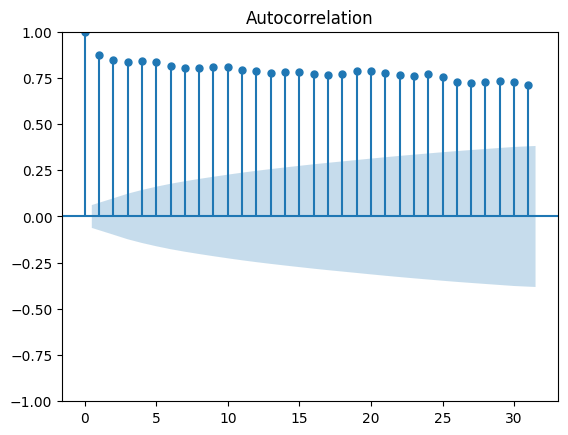

In [36]:
# Look at the autocorrelation of the topics
plot_acf(merged[big_topics[max_adf]])

plt.show()

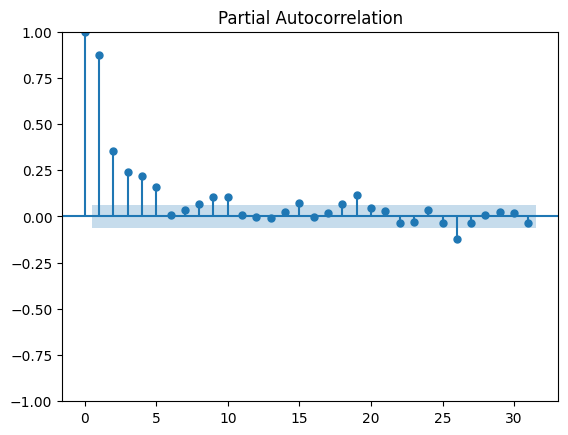

In [37]:
# Look at the partial autocorrelation of the topics
plot_pacf(merged[big_topics[max_adf]])

plt.show()

The autocorrelation for the most unstationary one is very high, the partial autocorrelation falls into the confidence interval after a few lags. This indicates it has some autoregression part in the data.

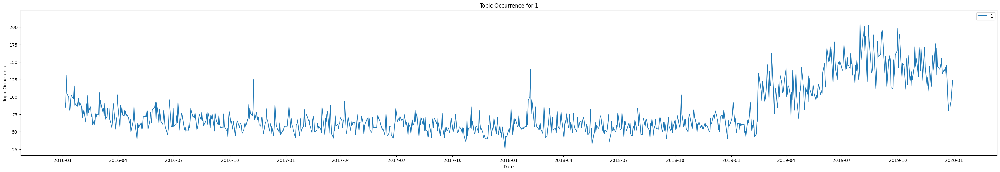

In [38]:
# Plot the occurrence of the topics
index = max_adf

plt.figure(figsize=(40, 6))

plt.plot(merged['date'], merged[big_topics[index]], label=big_topics[index])

plt.xlabel('Date')
plt.ylabel('Topic Occurrence')

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))  # Set major ticks at the start of each quarter
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Use '%Y-Q%q' for quarters

plt.title(f'Topic Occurrence for {big_topics[index]}')
plt.legend()

plt.show()

In [39]:
# Return all the topics with p-value < 0.05 and the ADF statistic less that the 5% sgificant level
p_values = stationarity_topic[:, 1]
ADF_values = stationarity_topic[:, 0]
significant_topics = [big_topics[i] for i in range(len(big_topics)) if (p_values[i] < 0.05)&(ADF_values[i] < adfuller(merged[big_topics[i]])[4]['5%'])]
print(len(significant_topics))

93


Now we intend to use these significant topics to predict the price.

In [40]:
# Not siginificant topics
not_significant_topics = [big_topics[i] for i in range(len(big_topics)) if (p_values[i] > 0.05)|(ADF_values[i] > adfuller(merged[big_topics[i]])[4]['5%'])]
print(len(not_significant_topics))

19


In [41]:
merged.drop(columns=not_significant_topics, inplace=True)

In [42]:
merged.head()

,date,return,return_hat_reduced,0,2,3,4,5,6,7,...,103,104,105,107,108,109,111,113,117,173
0,2016-01-05,0.008521,0.003810,46,22,19,218,22,16,17,...,5,0,0,7,4,2,0,0,0,0
1,2016-01-06,-0.008321,-0.011936,44,16,81,145,35,23,26,...,4,0,1,0,5,5,3,0,0,0
2,2016-01-07,-0.016006,-0.020314,63,21,35,76,41,30,17,...,0,0,1,0,4,2,2,0,0,0
3,2016-01-08,-0.020202,-0.009257,39,16,40,68,32,8,12,...,1,0,0,0,4,3,1,0,0,0
4,2016-01-11,-0.013389,0.001031,63,24,20,36,23,16,13,...,0,0,0,1,4,0,3,0,0,0


## The correlation

In [43]:
# Look at the correlation between the topics and the residual
residual = merged['return'] - merged['return_hat_reduced']
correlation = {col: merged[col].corr(residual) for col in merged.columns if col not in  ['date', 'return', 'return_hat_reduced']}

print(correlation)


{0: 0.010613133119299466, 2: 0.002010797324519947, 3: -0.032419876526790715, 4: 0.03508043943264698, 5: -0.013977982437187996, 6: -0.006228941871736592, 7: -0.0030389118192503607, 8: 0.01297533048189244, 10: -0.009999885961706124, 11: 0.046132348439150477, 13: 0.028854891960385647, 15: 0.053595403429259864, 16: -0.0008189502231050411, 17: -0.029780900960598315, 20: 0.018771809585108885, 21: 0.03178221227936748, 22: 0.010457972559666545, 23: 0.002971448365598356, 24: 0.026533441746583196, 25: 0.014070361183058218, 26: -0.013793153733196034, 27: 0.022880977327114357, 29: 0.003135357910902613, 30: -0.004180922147764566, 32: -0.019285504381641762, 33: -0.026434800029829363, 34: 0.003706458384577837, 35: -0.021597759708543118, 36: -0.0007973283345050101, 37: -0.006552582988542405, 38: -0.021003913253232934, 39: -0.004941972800274292, 40: 0.0010308202751685479, 41: -0.023861031781801854, 42: 0.016972438864770952, 43: 0.053983545301485136, 45: 0.0017716310627495925, 47: 0.006354597379027858, 

The correlation for each individual topics is small.

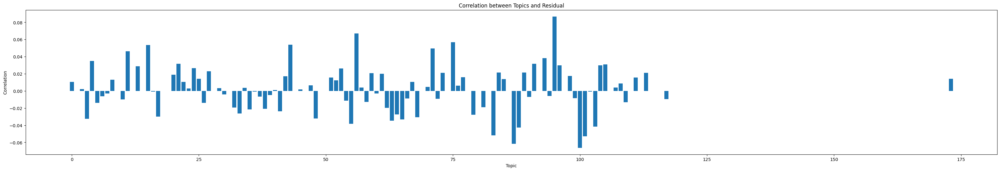

In [44]:
# Plot the correlation
plt.figure(figsize=(40, 6))

correlation_series = pd.Series(correlation)
plt.bar(correlation_series.index, correlation_series)

plt.xlabel('Topic')
plt.ylabel('Correlation')

plt.title('Correlation between Topics and Residual')

plt.show()

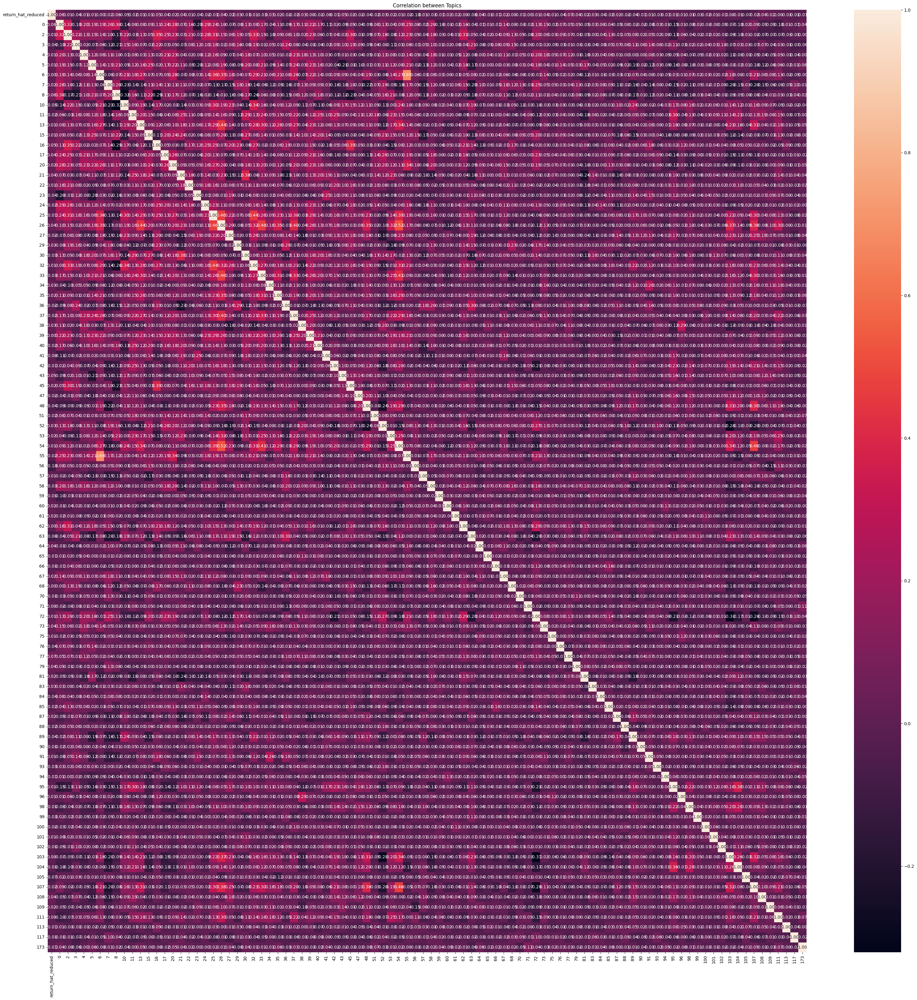

In [45]:
# Look at the correlation between the topics
correlation_features = merged.iloc[:, 2:].corr()

plt.figure(figsize=(40, 40))

sns.heatmap(correlation_features, annot=True, fmt=".2f")

plt.title('Correlation between Topics')

plt.show()

In [46]:
# Return the topics with correlation > 0.4
high_correlation = correlation_features.abs().stack()
high_correlation = high_correlation[high_correlation > 0.4]
high_correlation = high_correlation[high_correlation < 1]  # Exclude self-correlations
high_correlation = high_correlation.index

print(f"The topics with correlation > 0.4 are:",{topic for topic in high_correlation})

The topics with correlation > 0.4 are: {(54, 26), (33, 26), (25, 32), (26, 33), (13, 26), (55, 6), (26, 13), (33, 54), (54, 107), (6, 55), (26, 25), (26, 54), (32, 25), (107, 54), (54, 33), (25, 26)}


We may want to exclude the highly correlated topics

Now, we look at the binary feature:

In [47]:
# Consider the topics as binary
binary_merged = pd.DataFrame()
binary_merged['date'] = merged['date']
binary_merged['return'] = merged['return']
binary_merged['return_hat_reduced'] = merged['return_hat_reduced']
for topic in merged.columns[3:]:
    binary_merged[topic] = (merged[topic] > 0).astype(int)



In [48]:
binary_merged.head()

,date,return,return_hat_reduced,0,2,3,4,5,6,7,...,103,104,105,107,108,109,111,113,117,173
0,2016-01-05,0.008521,0.003810,1,1,1,1,1,1,1,...,1,0,0,1,1,1,0,0,0,0
1,2016-01-06,-0.008321,-0.011936,1,1,1,1,1,1,1,...,1,0,1,0,1,1,1,0,0,0
2,2016-01-07,-0.016006,-0.020314,1,1,1,1,1,1,1,...,0,0,1,0,1,1,1,0,0,0
3,2016-01-08,-0.020202,-0.009257,1,1,1,1,1,1,1,...,1,0,0,0,1,1,1,0,0,0
4,2016-01-11,-0.013389,0.001031,1,1,1,1,1,1,1,...,0,0,0,1,1,0,1,0,0,0


In [49]:
#Look at the correlation between the topics and the residual
correlation_binary = {col: binary_merged[col].corr(residual) for col in binary_merged.columns if col not in  ['date', 'return', 'return_hat_reduced']}

print(correlation_binary)

{0: nan, 2: nan, 3: nan, 4: nan, 5: nan, 6: 0.040308297100438116, 7: -0.028324122556651645, 8: nan, 10: -0.0543577022692528, 11: nan, 13: nan, 15: nan, 16: -0.009082628232656608, 17: 0.040308297100438116, 20: nan, 21: nan, 22: nan, 23: 0.05896231650521862, 24: nan, 25: nan, 26: nan, 27: nan, 29: 0.0430316139633728, 30: nan, 32: nan, 33: nan, 34: 0.04043605258901387, 35: 0.032525394736483554, 36: nan, 37: nan, 38: -0.037759401689775866, 39: nan, 40: 0.017508983941787744, 41: nan, 42: -0.011783376715016988, 43: nan, 45: 0.05220954202413025, 47: -0.01773227450762702, 48: nan, 51: nan, 52: -0.022187935974766874, 53: -0.020425255892020457, 54: 0.007087233352020451, 55: 0.0010232144688057316, 56: nan, 57: -0.05642837845007505, 58: nan, 59: -0.012185562147482818, 60: 0.04135306130116479, 61: 0.016501709523347036, 62: nan, 63: 0.0044961261531953, 64: 0.021622725238037648, 65: -0.033368180999534876, 66: -0.048315689964963965, 67: 0.0016552541196807687, 68: -0.0035780904871592386, 70: 0.00398078

/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


There are several rows which are identically 1, so no correlation. We need to drop these columns

In [50]:
# throw away the topics which is nan
correlation_binary_series = pd.Series(correlation_binary)
nan_topics = correlation_binary_series[correlation_binary_series.isna()].index
print(nan_topics)
print(len(nan_topics))

Index([  0,   2,   3,   4,   5,   8,  11,  13,  15,  20,  21,  22,  24,  25,
        26,  27,  30,  32,  33,  36,  37,  39,  41,  43,  48,  51,  56,  58,
        62,  71, 108],
      dtype='int64')
31


In [51]:
binary_merged.drop(columns=nan_topics, inplace=True)

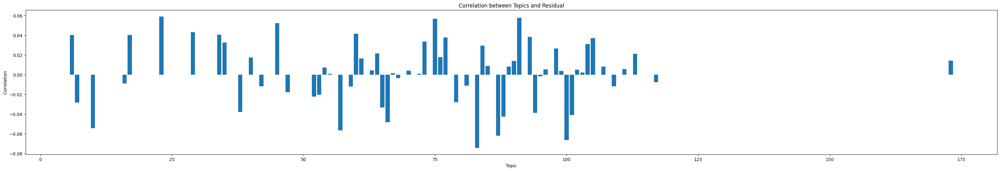

In [52]:
# Plot the correlation
plt.figure(figsize=(40, 6))

correlation_binary_series = pd.Series(correlation_binary)
plt.bar(correlation_binary_series.index, correlation_binary_series)

plt.xlabel('Topic')
plt.ylabel('Correlation')

plt.title('Correlation between Topics and Residual')

plt.show()

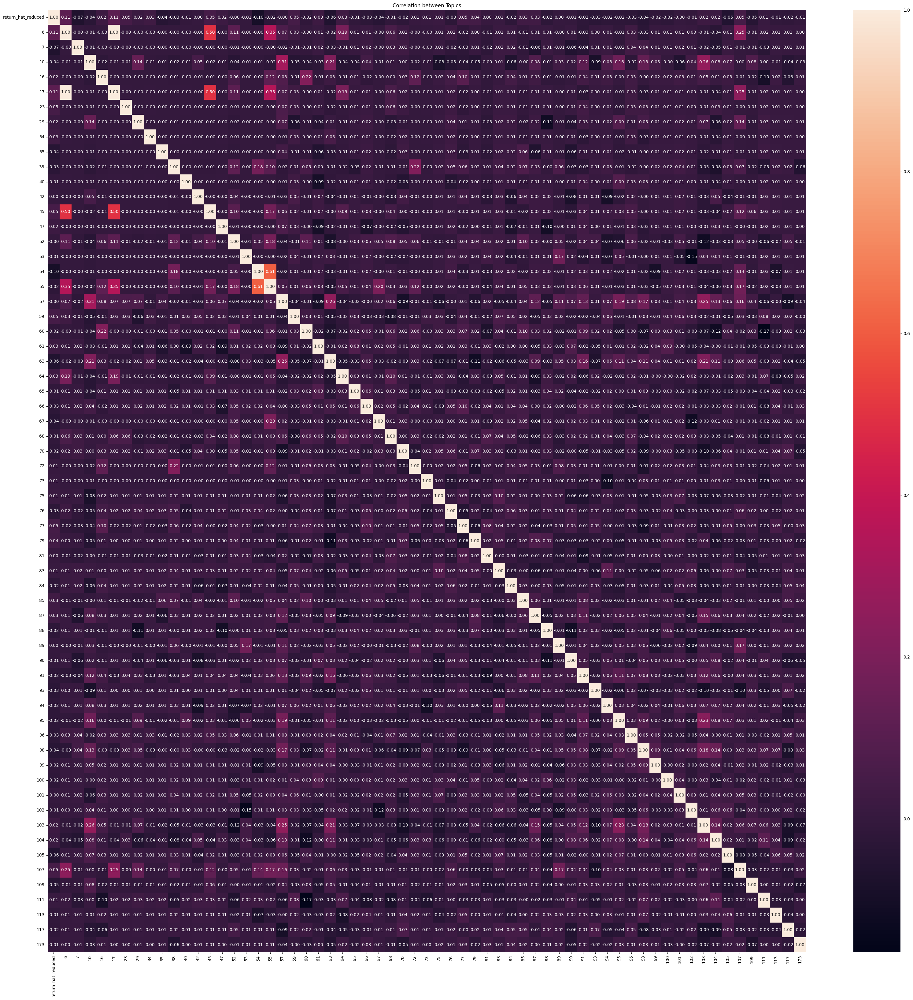

In [53]:
# Look at the correlation between the topics
correlation_features_binary = binary_merged.iloc[:, 2:].corr()

plt.figure(figsize=(40, 40))

sns.heatmap(correlation_features_binary, annot=True, fmt=".2f")

plt.title('Correlation between Topics')

plt.show()

In [54]:
# Return the topics with correlation > 0.4
high_correlation_binary = correlation_features_binary.abs().stack()
high_correlation_binary = high_correlation_binary[(high_correlation_binary > 0.4) & (high_correlation_binary < 1)].index
print(f"The topics with correlation > 0.4 are:",{topic for topic in high_correlation_binary})

The topics with correlation > 0.4 are: {(45, 17), (54, 55), (17, 45), (45, 6), (6, 45), (55, 54)}


In [55]:
merged.drop(columns=8, inplace=True)

## Training and prediction

In [56]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


In [57]:
# Use the lag of 1 feature

# Shift the data by 1
merged_shift = merged.copy()
merged_shift_1 = merged_shift.shift(periods=1)

merged_shift_1.drop(columns = ['date', 'return', 'return_hat_reduced'], inplace=True)
merged_shift_1.columns = [f"{col}_lag{1}" for col in merged_shift_1.columns]

# Shift the data by 2
merged_shift_2 = merged_shift.shift(periods=2)

merged_shift_2.drop(columns = ['date', 'return', 'return_hat_reduced'], inplace=True)
merged_shift_2.columns = [f"{col}_lag{2}" for col in merged_shift_2.columns]

# Shift the data by 3
merged_shift_3 = merged_shift.shift(periods=3)

merged_shift_3.drop(columns = ['date', 'return', 'return_hat_reduced'], inplace=True)
merged_shift_3.columns = [f"{col}_lag{3}" for col in merged_shift_3.columns]

# Concatenate the data

merged_concate = pd.concat([merged_shift, merged_shift_1], axis=1)
merged_concate = pd.concat([merged_concate, merged_shift_2], axis=1)
#merged_concate = pd.concat([merged_concate, merged_shift_3], axis=1)
merged_concate.drop(merged_concate.index[0], inplace=True)
merged_concate.drop(merged_concate.index[0], inplace=True)
#merged_concate.drop(merged_concate.index[0], inplace=True)
merged_concate.columns = merged_concate.columns.astype(str)
merged_concate.head()

,date,return,return_hat_reduced,0,2,3,4,5,6,7,...,103_lag2,104_lag2,105_lag2,107_lag2,108_lag2,109_lag2,111_lag2,113_lag2,117_lag2,173_lag2
2,2016-01-07,-0.016006,-0.020314,63,21,35,76,41,30,17,...,5.0,0.0,0.0,7.0,4.0,2.0,0.0,0.0,0.0,0.0
3,2016-01-08,-0.020202,-0.009257,39,16,40,68,32,8,12,...,4.0,0.0,1.0,0.0,5.0,5.0,3.0,0.0,0.0,0.0
4,2016-01-11,-0.013389,0.001031,63,24,20,36,23,16,13,...,0.0,0.0,1.0,0.0,4.0,2.0,2.0,0.0,0.0,0.0
5,2016-01-12,0.020491,0.003613,89,25,20,44,21,13,38,...,1.0,0.0,0.0,0.0,4.0,3.0,1.0,0.0,0.0,0.0
6,2016-01-13,0.005984,-0.017135,65,34,33,45,29,23,53,...,0.0,0.0,0.0,1.0,4.0,0.0,3.0,0.0,0.0,0.0


In [58]:
# Use the lag of 1 feature

# Shift the data by 1
binary_merged_shift = binary_merged.copy()
binary_merged_shift_1 = binary_merged_shift.shift(periods=1)

binary_merged_shift_1.drop(columns = ['date', 'return', 'return_hat_reduced'], inplace=True)
binary_merged_shift_1.columns = [f"{col}_lag{1}" for col in binary_merged_shift_1.columns]

# Shift the data by 2
binary_merged_shift_2 = binary_merged_shift.shift(periods=2)

binary_merged_shift_2.drop(columns = ['date', 'return', 'return_hat_reduced'], inplace=True)
binary_merged_shift_2.columns = [f"{col}_lag{2}" for col in binary_merged_shift_2.columns]

# Shift the data by 3
binary_merged_shift_3 = binary_merged_shift.shift(periods=3)

binary_merged_shift_3.drop(columns = ['date', 'return', 'return_hat_reduced'], inplace=True)
binary_merged_shift_3.columns = [f"{col}_lag{3}" for col in binary_merged_shift_3.columns]

# Concatenate the data

binary_merged_concate = pd.concat([binary_merged_shift, binary_merged_shift_1], axis=1)
binary_merged_concate = pd.concat([binary_merged_concate, binary_merged_shift_2], axis=1)
#binary_merged_concate = pd.concat([binary_merged_concate, binary_merged_shift_3], axis=1)
binary_merged_concate.drop(binary_merged_concate.index[0], inplace=True)
binary_merged_concate.drop(binary_merged_concate.index[0], inplace=True)
#binary_merged_concate.drop(binary_merged_concate.index[0], inplace=True)
binary_merged_concate.columns = binary_merged_concate.columns.astype(str)
binary_merged_concate.head()

,date,return,return_hat_reduced,6,7,10,16,17,23,29,...,102_lag2,103_lag2,104_lag2,105_lag2,107_lag2,109_lag2,111_lag2,113_lag2,117_lag2,173_lag2
2,2016-01-07,-0.016006,-0.020314,1,1,1,1,1,1,1,...,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
3,2016-01-08,-0.020202,-0.009257,1,1,1,1,1,1,1,...,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
4,2016-01-11,-0.013389,0.001031,1,1,1,1,1,1,1,...,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
5,2016-01-12,0.020491,0.003613,1,1,1,1,1,1,1,...,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
6,2016-01-13,0.005984,-0.017135,1,1,1,1,1,1,1,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


In [59]:
# Split the data into train and test

scale = StandardScaler()
train_data = merged_concate[merged_concate['date'] <= '2018-12-31']
test_data = merged_concate[merged_concate['date'] > '2018-12-31']

X_train = train_data.drop(columns=['date', 'return','return_hat_reduced'])
X_train_scaled = scale.fit_transform(X_train)
y_train = train_data['return'] - train_data['return_hat_reduced']
X_test = test_data.drop(columns=['date', 'return', 'return_hat_reduced'])
X_test_scaled = scale.transform(X_test)
y_test = test_data['return'] - test_data['return_hat_reduced']
print(X_train.shape, y_train.shape)

(751, 276) (751,)


In [60]:
# Define the PCA pipeline
n_components = 71


pca = PCA(n_components=n_components)
scaler = StandardScaler()
pipeline = Pipeline([('scaler', scaler), ('pca', pca)])

# Fit the pipeline
X_train_pca = pipeline.fit_transform(X_train)


In [61]:
# Define the binary merged data train test split
train_data_binary = binary_merged_concate[binary_merged_concate['date'] <= '2018-12-31']
test_data_binary = binary_merged_concate[binary_merged_concate['date'] > '2018-12-31']
X_train_binary = train_data_binary.drop(columns=['date', 'return', 'return_hat_reduced'])
y_train_binary = train_data_binary['return'] - train_data_binary['return_hat_reduced']
X_test_binary = test_data_binary.drop(columns=['date', 'return', 'return_hat_reduced'])
y_test_binary = test_data_binary['return'] - test_data_binary['return_hat_reduced']
print(X_train_binary.shape, y_train_binary.shape)

(751, 186) (751,)


In [195]:
# Calculate the mean of the residual
mean = (merged['return'] - merged['return_hat_reduced']).mean()
std =  (merged['return'] - merged['return_hat_reduced']).std()

# Calculate the 90% confidence intervals
ci_upper = mean + 1.645 * std
ci_lower = mean - 1.645 * std

In [62]:
# Define the function to measure the performance
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [63]:
def measure_performance(y_true, y_pred_reduced, y_pred_full):
    mse_1 = mean_squared_error(y_true, y_pred_reduced)
    mae_1 = mean_absolute_error(y_true, y_pred_reduced)
    r2_1 = r2_score(y_true, y_pred_reduced)

    mse_2 = mean_squared_error(y_true, y_pred_full)
    mae_2 = mean_absolute_error(y_true, y_pred_full)
    r2_2 = r2_score(y_true, y_pred_full)
 
    print(f"MSE of reduced model: {round(mse_1, 6)}, MSE of full model: {round(mse_2, 6)}, MAE of reduced model: {round(mae_1, 6)}, MAE of full model: {round(mae_2, 6)} r2 reduced model: {r2_1} r2 full model: {r2_2}")

In [64]:
def get_binary_accuracy(y_true, y_pred_reduced, y_pred_full):
    diff_true = y_true.diff(periods=-1)
    diff_true.dropna(inplace=True)
    diff_pred_reduced = y_pred_reduced.diff(periods=-1)
    diff_pred_reduced.dropna(inplace=True)
    diff_pred_full = y_pred_full.diff(periods=-1)
    diff_pred_full.dropna(inplace=True)
    accuracy_reduced = (diff_true * diff_pred_reduced > 0).mean()
    accuracy_full = (diff_true * diff_pred_full > 0).mean()
    print(f"Accuracy of reduced model: {round(accuracy_reduced, 6)}, Accuracy of full model: {round(accuracy_full, 6)}")


In [65]:
def get_first_order(y_true, y_pred_reduced, y_pred_full):
    y_true[y_true >0] = 1
    y_true[y_true <0] = -1

    y_pred_reduced[y_pred_reduced >0] = 1
    y_pred_reduced[y_pred_reduced <0] = -1

    y_pred_full[y_pred_full >0] = 1
    y_pred_full[y_pred_full <0] = -1

    accuracy_reduced = (y_true * y_pred_reduced > 0).mean()
    accuracy_full = (y_true * y_pred_full > 0).mean()
    print(f"Accuracy of reduced model: {round(accuracy_reduced, 6)}, Accuracy of full model: {round(accuracy_full, 6)}")

In [208]:
# Baseline MSE
baseline_mse = mean_squared_error(test_data['return'], np.ones(y_test.shape)*test_data['return'].iloc[0])
print(f"The baseline MSE is {baseline_mse}")

The baseline MSE is 1.9760956175298805


## Using XGBoost

In [66]:
import xgboost as xgb

In [204]:
xgb_model = xgb.XGBRegressor(n_estimators = 500, max_depth = 60, objective='reg:squarederror', random_state=42, reg_lambda=0.09)

xgb_model.fit(X_train_scaled, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=60, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [205]:


y_pred = xgb_model.predict(X_test_scaled)
y_pred_train = xgb_model.predict(X_train_scaled)

#
y_pred_full = y_pred + test_data['return_hat_reduced']


measure_performance(test_data['return'], test_data['return_hat_reduced'], y_pred_full)
#get_binary_accuracy(test_data['return'], test_data['return_hat_reduced'], y_pred_full)
get_first_order(test_data['return'], test_data['return_hat_reduced'], y_pred_full)

MSE of reduced model: 1.243028, MSE of full model: 1.240941, MAE of reduced model: 0.621514, MAE of full model: 0.624602 r2 reduced model: -0.24320548641097295 r2 full model: -0.24111820745244494
Accuracy of reduced model: 0.689243, Accuracy of full model: 0.689243


/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true <0]

In [190]:
y_pred

array([ 2.6817061e-03, -7.4101170e-04, -6.5227589e-03, -2.0538841e-03,
       -3.5115558e-04,  1.3944565e-03, -2.0207248e-03, -3.0131275e-03,
        4.7037159e-03,  2.3563546e-03,  5.2544968e-03,  7.2354879e-03,
        6.1006686e-03,  1.6836637e-03,  9.4744028e-04, -4.1713864e-03,
       -2.6981961e-03,  4.4737533e-03,  4.1780644e-03,  2.9683853e-03,
        9.4062248e-03,  6.3499640e-04,  5.5313408e-03,  3.9636102e-03,
        4.8418734e-03,  3.7064585e-03, -2.5201484e-03,  1.0390189e-03,
       -5.7327030e-03,  6.4802356e-03, -9.6177752e-04,  1.0353528e-02,
        1.1517831e-02, -4.8672054e-03,  5.5245501e-03,  5.4269633e-03,
        8.3370702e-03,  9.0107238e-03,  3.8842512e-03,  2.5807281e-03,
       -7.1268738e-04,  3.7244910e-03,  2.4554625e-04,  8.4201591e-03,
        1.3706194e-02,  1.0989029e-02,  6.9671827e-03,  7.6262481e-03,
        6.2115206e-03,  7.1195932e-03,  8.9052366e-03,  4.4776429e-03,
        4.3820720e-03,  6.0786242e-03,  6.9910195e-03,  5.3360728e-03,
      

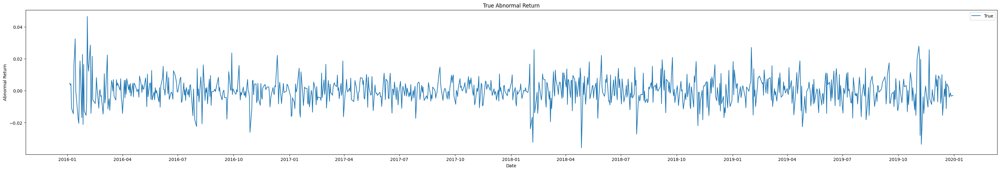

In [191]:
plt.figure(figsize=(40, 6))

plt.plot(merged['date'], merged['return']-merged['return_hat_reduced'], label='True')

plt.xlabel('Date')
plt.ylabel('Abnormal Return')

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))  # Set major ticks at the start of each quarter
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Use '%Y-Q%q' for quarters

plt.title('True Abnormal Return')
plt.legend()

plt.show()


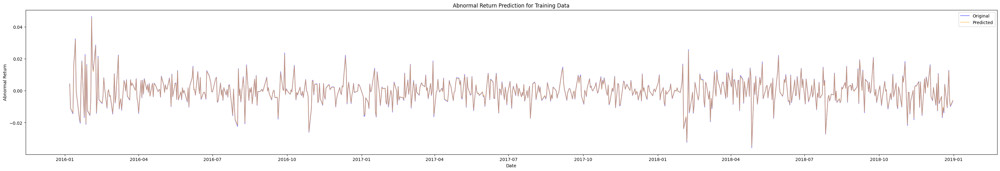

In [192]:
plt.figure(figsize=(40, 6))

plt.plot(train_data['date'], train_data['return']-train_data['return_hat_reduced'], label='Original', color = 'blue', alpha = 0.5)
plt.plot(train_data['date'], y_pred_train, label='Predicted', color = 'orange', alpha = 0.5)

plt.xlabel('Date')

plt.ylabel('Abnormal Return')

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))  # Set major ticks at the start of each quarter
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Use '%Y-Q%q' for quarters

plt.title('Abnormal Return Prediction for Training Data')
plt.legend()

plt.show()

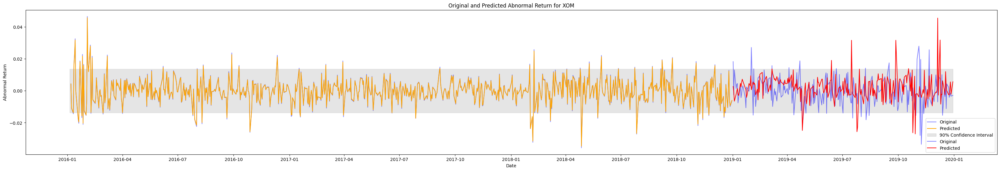

In [196]:
# Plot the original and predicted values
plt.figure(figsize=(40, 6))

plt.plot(train_data['date'], train_data['return']-train_data['return_hat_reduced'], label='Original', color = 'blue', alpha = 0.5)
plt.plot(train_data['date'], y_pred_train, label='Predicted', color = 'orange')
plt.fill_between(merged['date'], ci_upper, ci_lower, color='gray', alpha=0.2, label='90% Confidence Interval')
plt.plot(test_data['date'], y_test, label='Original', color = 'blue', alpha = 0.5)
plt.plot(test_data['date'], y_pred, label='Predicted', color = 'red')

plt.xlabel('Date')
plt.ylabel('Abnormal Return')

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))  # Set major ticks at the start of each quarter
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Use '%Y-Q%q' for quarters

plt.title(f'Original and Predicted Abnormal Return for {ticker}')
plt.legend()

plt.show()

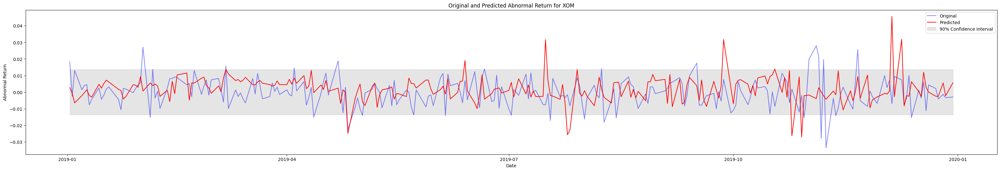

In [197]:
# Plot the original and predicted values
plt.figure(figsize=(40, 6))

plt.plot(test_data['date'], y_test, label='Original', color = 'blue', alpha = 0.5)
plt.plot(test_data['date'], y_pred, label='Predicted', color = 'red')
plt.fill_between(test_data['date'], ci_upper, ci_lower, color='gray', alpha=0.2, label='90% Confidence Interval')

plt.xlabel('Date')
plt.ylabel('Abnormal Return')

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))  # Set major ticks at the start of each quarter
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Use '%Y-Q%q' for quarters

plt.title(f'Original and Predicted Abnormal Return for {ticker}')
plt.legend()

plt.show()

In [74]:
correlation_xgb_rescaled = np.corrcoef(y_test, y_pred)[0, 1]
print(correlation_xgb_rescaled)

0.05284732953365125


In [75]:
# Use the PCA feature

xgb_model_pca = xgb.XGBRegressor(n_estimators = 500, max_depth = 20, objective='reg:squarederror', random_state=42)

xgb_model_pca.fit(X_train_pca, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=20, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [76]:

X_test_pca = pipeline.transform(X_test)

y_pred_pca = xgb_model_pca.predict(X_test_pca)
#
y_pred_pca_full = y_pred_pca + test_data['return_hat_reduced']


measure_performance(test_data['return'], test_data['return_hat_reduced'], y_pred_pca_full)

MSE of reduced model: 7.7e-05, MSE of full model: 8.3e-05, MAE of reduced model: 0.00674, MAE of full model: 0.006884 r2 reduced model: 0.43552722689058176 r2 full model: 0.39372919594939004


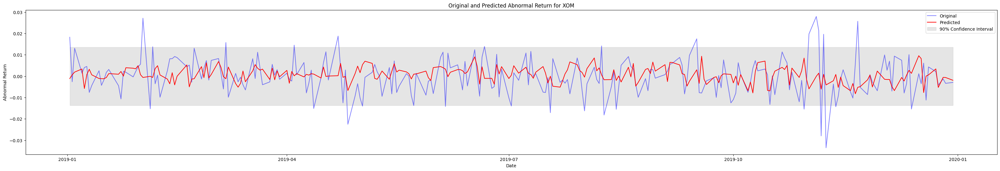

In [198]:
#Plot the original and predicted values
plt.figure(figsize=(40, 6))

plt.plot(test_data['date'], y_test, label='Original', color = 'blue', alpha = 0.5)
plt.plot(test_data['date'], y_pred_pca, label='Predicted', color = 'red')
plt.fill_between(test_data['date'], ci_upper, ci_lower, color='gray', alpha=0.2, label='90% Confidence Interval')

plt.xlabel('Date')
plt.ylabel('Abnormal Return')

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))  # Set major ticks at the start of each quarter
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Use '%Y-Q%q' for quarters

plt.title(f'Original and Predicted Abnormal Return for {ticker}')
plt.legend()

plt.show()

In [78]:
correlation_xgb_pca = np.corrcoef(y_test, y_pred_pca)[0, 1]
print(correlation_xgb_pca)

0.11934746014399253


In [79]:
# Use the binary features

xgb_model_binary = xgb.XGBRegressor(n_estimators = 500, max_depth = 10, objective='reg:squarederror', random_state=42, reg_lambda=10)

xgb_model_binary.fit(X_train_binary, y_train_binary)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=10, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [80]:
y_pred_binary = xgb_model_binary.predict(X_test_binary)
#
y_pred_binary_full = y_pred_binary + test_data['return_hat_reduced']


measure_performance(test_data['return'], test_data['return_hat_reduced'], y_pred_binary_full)

MSE of reduced model: 7.7e-05, MSE of full model: 9.3e-05, MAE of reduced model: 0.00674, MAE of full model: 0.007338 r2 reduced model: 0.43552722689058176 r2 full model: 0.323653540738412


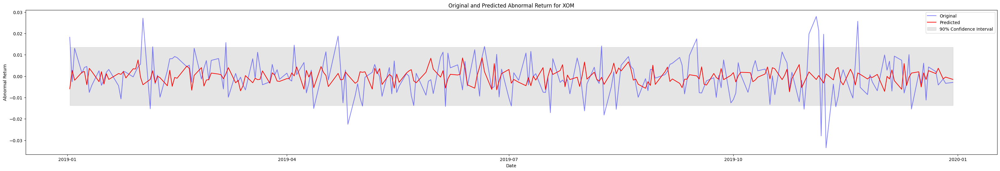

In [199]:
plt.figure(figsize=(40, 6))

plt.plot(test_data_binary['date'], y_test_binary, label='Original', color = 'blue', alpha = 0.5)
plt.plot(test_data_binary['date'], y_pred_binary, label='Predicted', color = 'red')
plt.fill_between(test_data['date'], ci_upper, ci_lower, color='gray', alpha=0.2, label='90% Confidence Interval')

plt.xlabel('Date')
plt.ylabel('Abnormal Return')

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))  # Set major ticks at the start of each quarter
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Use '%Y-Q%q' for quarters

plt.title(f'Original and Predicted Abnormal Return for {ticker}')
plt.legend()

plt.show()

In [82]:
correlation_xgb_binary = np.corrcoef(y_test_binary, y_pred_binary)[0, 1]
print(correlation_xgb_binary)

-0.08518841599613812


## Using ElasticNet Regression and Randomforest regressor

In [83]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.metrics import make_scorer
from sklearn.ensemble import RandomForestRegressor

In [84]:
# Convert the custom function to a scorer


def correlation_scorer(y_true, y_pred):
    return np.corrcoef(y_true, y_pred)[0, 1]

def binary_score(y_true, y_pred):
    diff_true = pd.DataFrame(y_true).diff(periods=-1)
    diff_true.dropna(inplace=True)
    diff_pred = pd.DataFrame(y_pred).diff(periods=-1)
    diff_pred.dropna(inplace=True)
    return (diff_true * diff_pred > 0).mean()

def first_order_score(y_true, y_pred):
    y_true[y_true >0] = 1
    y_true[y_true <0] = -1

    y_pred[y_pred >0] = 1
    y_pred[y_pred <0] = -1

    return (y_true * y_pred > 0).mean()

# Create a scorer from the custom function
#scoring = make_scorer(correlation_scorer, greater_is_better=True)
#scoring = make_scorer(binary_score, greater_is_better=True)
scoring = make_scorer(first_order_score, greater_is_better=True)

# Calculate the mean of the residual
mean = (merged['return'] - merged['return_hat_reduced']).mean()
std =  (merged['return'] - merged['return_hat_reduced']).std()

# Calculate the 90% confidence intervals
ci_upper = mean + 1.645 * std
ci_lower = mean - 1.645 * std


# Test the model
def testmodel(model, parameter, X_train, y_train, X_test, y_test):
    # Use GridSearchCV to find the best parameters
    grid = GridSearchCV(model, param_grid=parameter, scoring=scoring, n_jobs=-1, verbose=1)
    grid.fit(X_train, y_train)
    print(grid.best_params_)
    # Get the best model
    best_model = grid.best_estimator_
    y_pred = best_model.predict(X_test)
    # Measure the performance
    y_pred_full = y_pred + test_data['return_hat_reduced']
    measure_performance(test_data['return'], test_data['return_hat_reduced'], y_pred_full)
    #get_binary_accuracy(test_data['return'], test_data['return_hat_reduced'], y_pred_full)
    get_first_order(test_data['return'], test_data['return_hat_reduced'], y_pred_full)
    return y_pred, best_model

# Plot the original and predicted values
def plot_result(y_test, y_pred):
    plt.figure(figsize=(40, 6))

    plt.plot(test_data['date'], y_test, label='Original', color = 'blue', alpha = 0.5)
    plt.plot(test_data['date'], y_pred, label='Predicted', color = 'red')
    # Plot the confidence intervals
    plt.fill_between(test_data['date'], ci_upper, ci_lower, color='gray', alpha=0.2, label='90% Confidence Interval')

    plt.xlabel('Date')
    plt.ylabel('Abnormal Return')

    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))  # Set major ticks at the start of each quarter
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Use '%Y-Q%q' for quarters

    plt.title(f'Original and Predicted Abnormal Return for {ticker}')
    plt.legend()

    plt.show()

# Plot all:
def plot_all(X_train, y_train, X_test, y_test, model):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)

    plt.figure(figsize=(40, 6))

    plt.plot(train_data['date'], y_train, label='Original', color = 'blue', alpha = 0.5)
    plt.plot(train_data['date'], y_train_pred, label='Predicted', color = 'orange', alpha = 0.5)
    # Plot the confidence intervals
    plt.fill_between(merged['date'], ci_upper, ci_lower, color='gray', alpha=0.2, label='90% Confidence Interval')

    plt.plot(test_data['date'], y_test, label='Original', color = 'blue', alpha = 0.5)
    plt.plot(test_data['date'], y_pred, label='Predicted', color = 'red')

    plt.xlabel('Date')
    plt.ylabel('Abnormal Return')

    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))  # Set major ticks at the start of each quarter
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Use '%Y-Q%q' for quarters

    plt.title(f'Original and Predicted Abnormal Return for {ticker}')
    plt.legend()

    plt.show()

### Lasso

In [146]:
parameter_lasso = {'alpha': [1e-5, 0.0001, 0.001, 0.01, 0.1,1,10,100], 'max_iter': [100, 500 ,1000, 10000, 100000]}
lasso = Lasso(fit_intercept=False, random_state=42)


In [147]:
# Rescaled features
y_pred_lasso, best_model_lasso = testmodel(lasso, parameter_lasso, X_train_scaled, y_train, X_test_scaled, y_test)


Fitting 5 folds for each of 40 candidates, totalling 200 fits


/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.106e-03, tolerance: 4.492e-06
  model = cd_fast.enet_coordinate_descent(
/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.751e-05, tolerance: 4.219e-06
  model = cd_fast.enet_coordinate_descent(
/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/sklearn

{'alpha': 1e-05, 'max_iter': 100}
MSE of reduced model: 1.243028, MSE of full model: 1.24287, MAE of reduced model: 0.621514, MAE of full model: 0.624776 r2 reduced model: -0.24320548641097295 r2 full model: -0.2430476872238898
Accuracy of reduced model: 0.689243, Accuracy of full model: 0.689243


/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true <0]

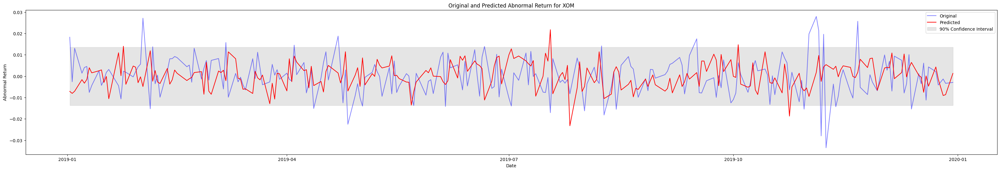

In [87]:

plot_result(y_test, y_pred_lasso)

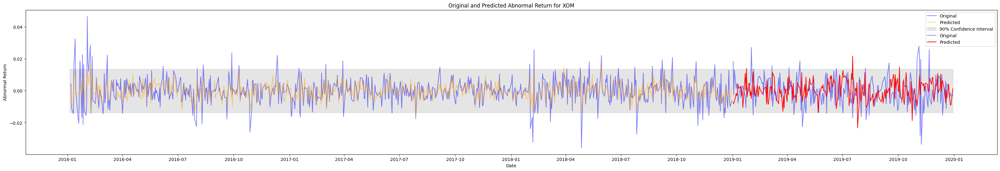

In [88]:

plot_all(X_train_scaled, y_train, X_test_scaled, y_test, best_model_lasso)

In [89]:
# compute the correlation of y_pred_lasso and y_test
correlation_lasso = np.corrcoef(y_pred_lasso, y_test)
print(correlation_lasso)

[[ 1.         -0.07057037]
 [-0.07057037  1.        ]]


In [90]:
# PCA features
y_pred_lasso_pca, best_model_lasso_pca = testmodel(lasso, parameter_lasso, X_train_pca, y_train, X_test_pca, y_test)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
{'alpha': 0.0001, 'max_iter': 100}
MSE of reduced model: 1.243028, MSE of full model: 1.243004, MAE of reduced model: 0.621514, MAE of full model: 0.622646 r2 reduced model: -0.24320548641097295 r2 full model: -0.24318178332283336
Accuracy of reduced model: 0.689243, Accuracy of full model: 0.689243


/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true <0]

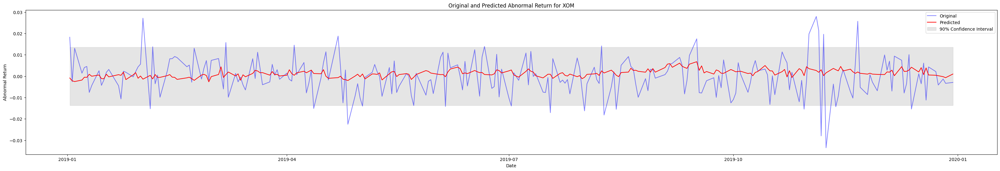

In [91]:
plot_result(y_test, y_pred_lasso_pca)

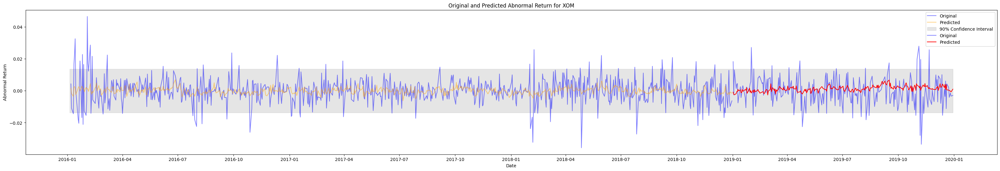

In [92]:
plot_all(X_train_pca, y_train, X_test_pca, y_test, best_model_lasso_pca)

In [93]:
correlation_lasso_pca = np.corrcoef(y_pred_lasso_pca, y_test)
print(correlation_lasso_pca)

[[1.         0.01126199]
 [0.01126199 1.        ]]


In [94]:
# Binary features
y_pred_lasso_binary, best_model_lasso_binary = testmodel(lasso, parameter_lasso, X_train_binary, y_train_binary, X_test_binary, y_test_binary)

Fitting 5 folds for each of 40 candidates, totalling 200 fits


/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.860e-03, tolerance: 3.364e-06
  model = cd_fast.enet_coordinate_descent(
/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.380e-02, tolerance: 4.219e-06
  model = cd_fast.enet_coordinate_descent(
/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/sklearn

{'alpha': 0.0001, 'max_iter': 500}
MSE of reduced model: 1.243028, MSE of full model: 1.243159, MAE of reduced model: 0.621514, MAE of full model: 0.622136 r2 reduced model: -0.24320548641097295 r2 full model: -0.2433365334936266
Accuracy of reduced model: 0.689243, Accuracy of full model: 0.689243


/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true <0]

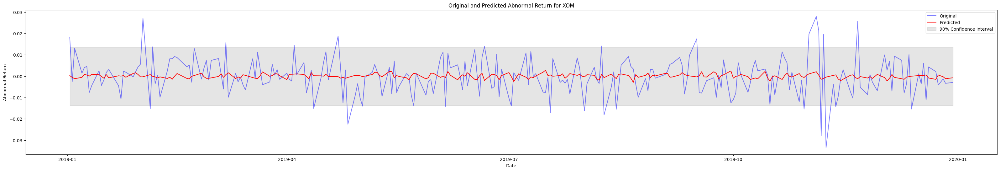

In [95]:
plot_result(y_test_binary, y_pred_lasso_binary)

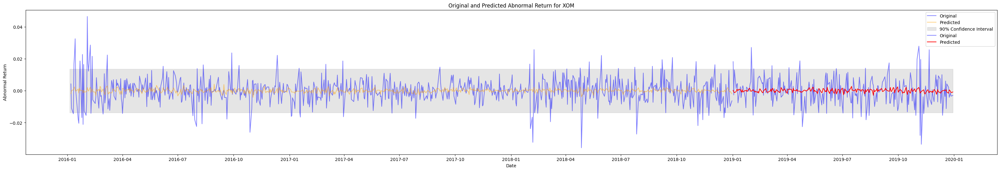

In [96]:
plot_all(X_train_binary, y_train_binary, X_test_binary, y_test_binary, best_model_lasso_binary)

In [97]:
correlation_lasso_binary = np.corrcoef(y_pred_lasso_binary, y_test_binary)
print(correlation_lasso_binary)

[[ 1.         -0.03761218]
 [-0.03761218  1.        ]]


### Ridge

In [98]:
parameter_ridge = {'alpha': [1e-5, 0.0001, 0.001, 0.01, 0.1,1,10,100], 'max_iter': [100, 500 ,1000, 10000, 100000]}

ridge = Ridge(fit_intercept=False, random_state=42)

In [99]:
# Rescaled features
y_pred_ridge, best_model_ridge = testmodel(ridge, parameter_ridge, X_train_scaled, y_train, X_test_scaled, y_test)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
{'alpha': 1, 'max_iter': 100}
MSE of reduced model: 1.243028, MSE of full model: 1.24288, MAE of reduced model: 0.621514, MAE of full model: 0.624985 r2 reduced model: -0.24320548641097295 r2 full model: -0.2430578951068776
Accuracy of reduced model: 0.689243, Accuracy of full model: 0.689243


/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true <0]

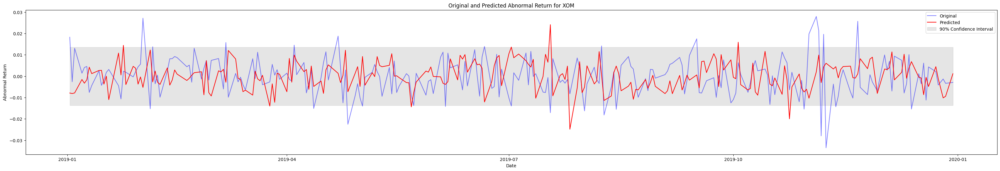

In [100]:
plot_result(y_test, y_pred_ridge)

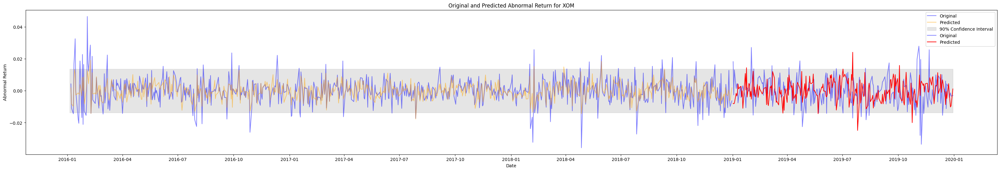

In [101]:
plot_all(X_train_scaled, y_train, X_test_scaled, y_test, best_model_ridge)

In [102]:
correlation_ridge_rescaled = np.corrcoef(y_pred_ridge, y_test)
print(correlation_ridge_rescaled)

[[ 1.         -0.07719203]
 [-0.07719203  1.        ]]


In [103]:
# PCA features
y_pred_ridge_pca, best_model_ridge_pca = testmodel(ridge, parameter_ridge, X_train_pca, y_train, X_test_pca, y_test)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
{'alpha': 100, 'max_iter': 100}
MSE of reduced model: 1.243028, MSE of full model: 1.242985, MAE of reduced model: 0.621514, MAE of full model: 0.62276 r2 reduced model: -0.24320548641097295 r2 full model: -0.24316253637250074
Accuracy of reduced model: 0.689243, Accuracy of full model: 0.689243


/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true <0]

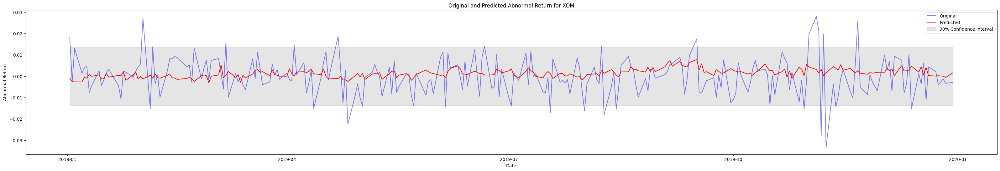

In [104]:
plot_result(y_test, y_pred_ridge_pca)

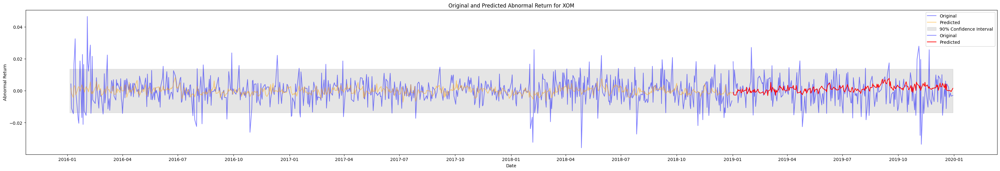

In [105]:
plot_all(X_train_pca, y_train, X_test_pca, y_test, best_model_ridge_pca)

In [106]:
correlation_ridge_pca = np.corrcoef(y_pred_ridge_pca, y_test)
print(correlation_ridge_pca)

[[1.         0.01956375]
 [0.01956375 1.        ]]


In [107]:
# Binary features
y_pred_ridge_binary, best_model_ridge_binary = testmodel(ridge, parameter_ridge, X_train_binary, y_train_binary, X_test_binary, y_test_binary)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
{'alpha': 100, 'max_iter': 100}
MSE of reduced model: 1.243028, MSE of full model: 1.243089, MAE of reduced model: 0.621514, MAE of full model: 0.622255 r2 reduced model: -0.24320548641097295 r2 full model: -0.24326681999137256
Accuracy of reduced model: 0.689243, Accuracy of full model: 0.689243


/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true <0]

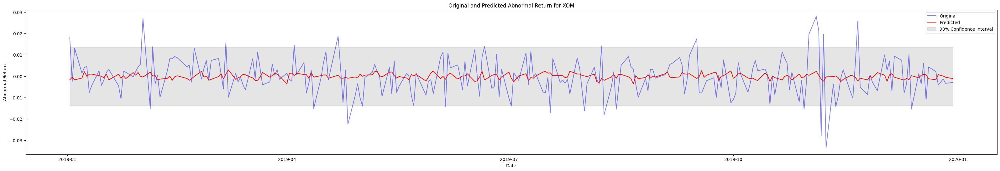

In [108]:
plot_result(y_test_binary, y_pred_ridge_binary)

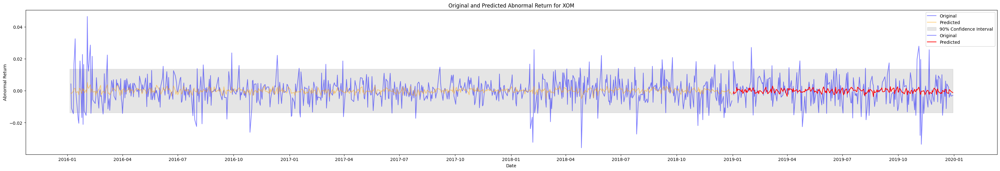

In [109]:
plot_all(X_train_binary, y_train_binary, X_test_binary, y_test_binary, best_model_ridge_binary)

In [110]:
correlation_ridge_binary = np.corrcoef(y_pred_ridge_binary, y_test_binary)
print(correlation_ridge_binary)

[[ 1.         -0.06313499]
 [-0.06313499  1.        ]]


### Elastic net

In [111]:
parameter_elastic = {'alpha': [1e-5, 0.0001, 0.001, 0.01, 0.1,1,10,100], 'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9], 'max_iter': [100, 500 ,1000, 10000, 100000]}
elastic = ElasticNet(fit_intercept=False, random_state=42)

In [112]:
# Rescaled features
y_pred_elastic, best_model_elastic = testmodel(elastic, parameter_elastic, X_train_scaled, y_train, X_test_scaled, y_test)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.459e-03, tolerance: 3.364e-06
  model = cd_fast.enet_coordinate_descent(
/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.205e-03, tolerance: 4.219e-06
  model = cd_fast.enet_coordinate_descent(
/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/sklearn

{'alpha': 0.001, 'l1_ratio': 0.7, 'max_iter': 100}
MSE of reduced model: 1.243028, MSE of full model: 1.24295, MAE of reduced model: 0.621514, MAE of full model: 0.62164 r2 reduced model: -0.24320548641097295 r2 full model: -0.243127968739679
Accuracy of reduced model: 0.689243, Accuracy of full model: 0.689243


/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true <0]

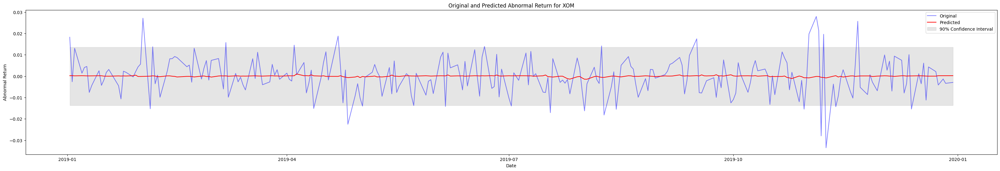

In [113]:
plot_result(y_test, y_pred_elastic)

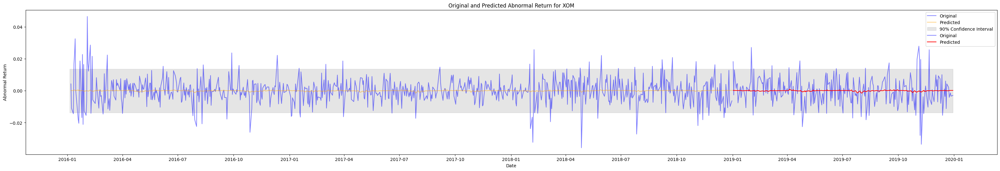

In [114]:
plot_all(X_train_scaled, y_train, X_test_scaled, y_test, best_model_elastic)

In [115]:
correlation_elastic = np.corrcoef(y_pred_elastic, y_test)
print(correlation_elastic)

[[1.         0.13057368]
 [0.13057368 1.        ]]


In [116]:
# PCA features
y_pred_elastic_pca, best_model_elastic_pca = testmodel(elastic, parameter_elastic, X_train_pca, y_train, X_test_pca, y_test)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits
{'alpha': 0.001, 'l1_ratio': 0.7, 'max_iter': 100}
MSE of reduced model: 1.243028, MSE of full model: 1.243068, MAE of reduced model: 0.621514, MAE of full model: 0.621761 r2 reduced model: -0.24320548641097295 r2 full model: -0.24324582980382603
Accuracy of reduced model: 0.689243, Accuracy of full model: 0.689243


/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true <0]

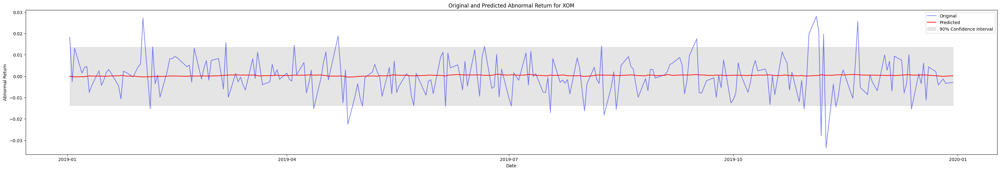

In [117]:
plot_result(y_test, y_pred_elastic_pca)

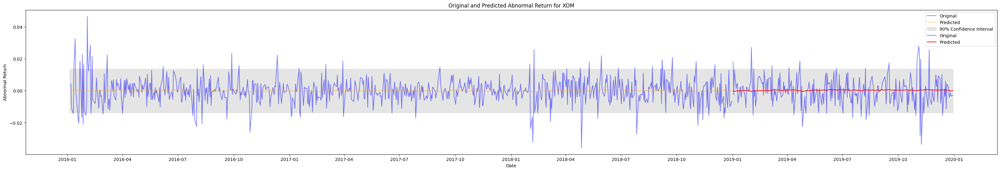

In [118]:
plot_all(X_train_pca, y_train, X_test_pca, y_test, best_model_elastic_pca)

In [119]:
correlation_elastic_pca = np.corrcoef(y_pred_elastic_pca, y_test)
print(correlation_elastic_pca)

[[ 1.         -0.03823841]
 [-0.03823841  1.        ]]


In [120]:
# Binary features
y_pred_elastic_binary, best_model_elastic_binary = testmodel(elastic, parameter_elastic, X_train_binary, y_train_binary, X_test_binary, y_test_binary)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.302e-02, tolerance: 3.364e-06
  model = cd_fast.enet_coordinate_descent(
/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.601e-02, tolerance: 4.219e-06
  model = cd_fast.enet_coordinate_descent(
/Users/xiaokangwang/Library/Caches/pypoetry/virtualenvs/erdosnewsfinanceproject-fYB74UfD-py3.12/lib/python3.12/site-packages/sklearn

{'alpha': 0.001, 'l1_ratio': 0.1, 'max_iter': 500}
MSE of reduced model: 1.243028, MSE of full model: 1.243159, MAE of reduced model: 0.621514, MAE of full model: 0.622133 r2 reduced model: -0.24320548641097295 r2 full model: -0.2433361451222189
Accuracy of reduced model: 0.689243, Accuracy of full model: 0.689243


/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true <0]

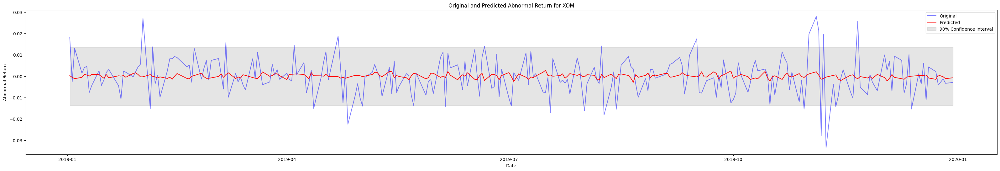

In [121]:
plot_result(y_test_binary, y_pred_elastic_binary)

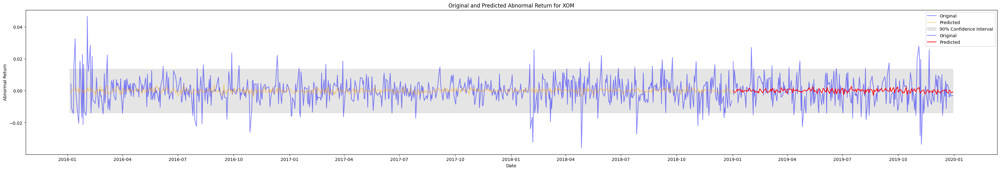

In [122]:
plot_all(X_train_binary, y_train_binary, X_test_binary, y_test_binary, best_model_elastic_binary)

In [123]:
correlation_elastic_binary = np.corrcoef(y_pred_elastic_binary, y_test_binary)
print(correlation_elastic_binary)

[[ 1.         -0.03792297]
 [-0.03792297  1.        ]]


### Random Forest

In [124]:
# Random Forest
parameter_rf = {'n_estimators': [100, 200, 300, 400, 500], 'max_depth': [10, 20, 30, 40, 50]}
rf = RandomForestRegressor(random_state=42)

In [125]:
# Rescaled features
y_pred_rf, best_model_rf = testmodel(rf, parameter_rf, X_train_scaled, y_train, X_test_scaled, y_test)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
{'max_depth': 30, 'n_estimators': 100}
MSE of reduced model: 1.243028, MSE of full model: 1.242565, MAE of reduced model: 0.621514, MAE of full model: 0.62287 r2 reduced model: -0.24320548641097295 r2 full model: -0.24274278257584125
Accuracy of reduced model: 0.689243, Accuracy of full model: 0.689243


/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true <0]

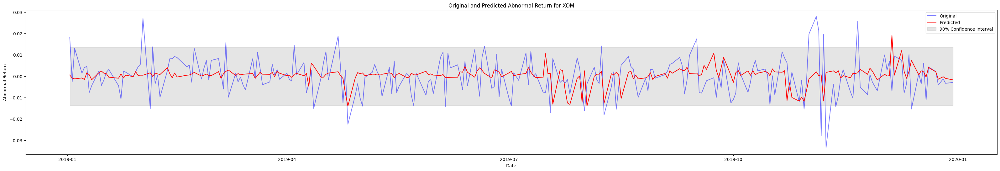

In [126]:
plot_result(y_test, y_pred_rf)

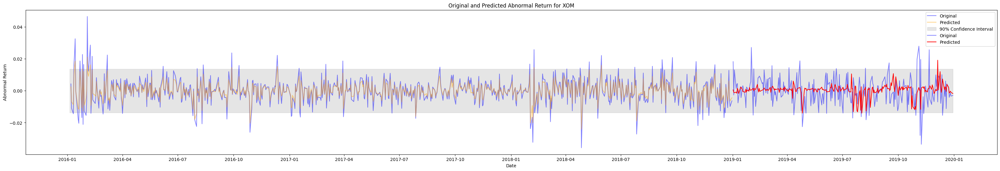

In [127]:
plot_all(X_train_scaled, y_train, X_test_scaled, y_test, best_model_rf)

In [128]:
correlation_rf = np.corrcoef(y_pred_rf, y_test)
print(correlation_rf)

[[1.         0.05909752]
 [0.05909752 1.        ]]


In [129]:
# PCA features
y_pred_rf_pca, best_model_rf_pca = testmodel(rf, parameter_rf, X_train_pca, y_train, X_test_pca, y_test)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
{'max_depth': 20, 'n_estimators': 100}
MSE of reduced model: 1.243028, MSE of full model: 1.242847, MAE of reduced model: 0.621514, MAE of full model: 0.6223 r2 reduced model: -0.24320548641097295 r2 full model: -0.2430243226585056
Accuracy of reduced model: 0.689243, Accuracy of full model: 0.689243


/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true <0]

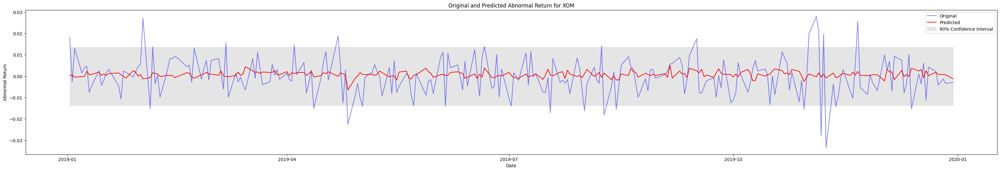

In [130]:
plot_result(y_test, y_pred_rf_pca)

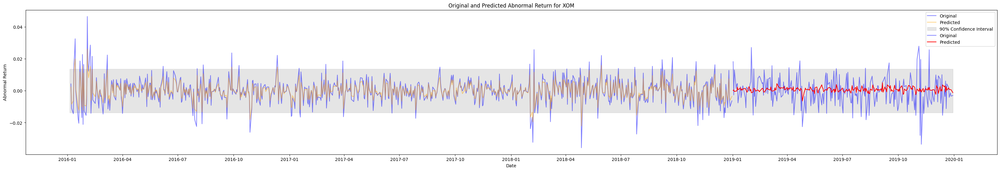

In [131]:
plot_all(X_train_pca, y_train, X_test_pca, y_test, best_model_rf_pca)

In [132]:
correlation_rf_pca = np.corrcoef(y_pred_rf_pca, y_test)
print(correlation_rf_pca)

[[1.        0.1004054]
 [0.1004054 1.       ]]


In [133]:
# Binary features
y_pred_rf_binary, best_model_rf_binary = testmodel(rf, parameter_rf, X_train_binary, y_train_binary, X_test_binary, y_test_binary)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
{'max_depth': 30, 'n_estimators': 400}
MSE of reduced model: 1.243028, MSE of full model: 1.242929, MAE of reduced model: 0.621514, MAE of full model: 0.622221 r2 reduced model: -0.24320548641097295 r2 full model: -0.2431066958563013
Accuracy of reduced model: 0.689243, Accuracy of full model: 0.689243


/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true >0] = 1
/var/folders/l_/txq0vh11623_5lrnfw_cpmsh0000gn/T/ipykernel_68868/18287186.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_true[y_true <0]

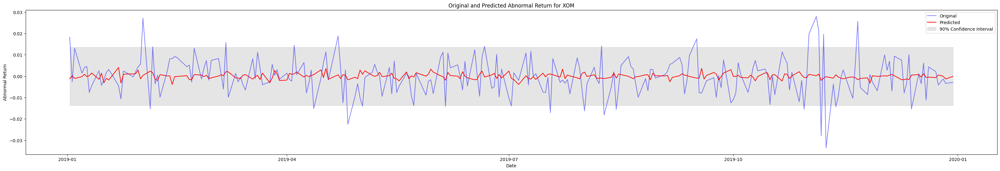

In [134]:
plot_result(y_test_binary, y_pred_rf_binary)

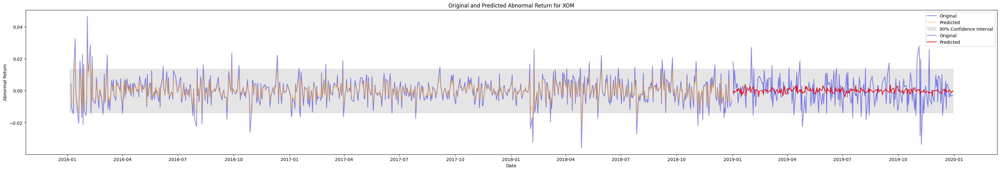

In [135]:
plot_all(X_train_binary, y_train_binary, X_test_binary, y_test_binary, best_model_rf_binary)

In [136]:
correlation_rf_binary = np.corrcoef(y_pred_rf_binary, y_test_binary)
print(correlation_rf_binary)

[[ 1.         -0.04871549]
 [-0.04871549  1.        ]]
